<a href="https://colab.research.google.com/github/gm-spacagna/deep-picture-embedding-features/blob/main/Deep_picture_embedding_features_COCO_ResNext.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prepare environment

In [2]:
from google.colab.output import eval_js
def shrink(height="300"):
    eval_js(f'google.colab.output.setIframeHeight({height})')


In [76]:
! pip install --upgrade pip
! pip install torch torchvision torchsummary gca pandas numpy matplotlib seaborn scikit-learn==0.23.2 pycocotools tqdm umap-learn
! pip install git+https://github.com/waleedka/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI
! pip list
shrink()

Requirement already up-to-date: pip in /usr/local/lib/python3.6/dist-packages (20.2.4)
Package                       Version
----------------------------- ---------------
absl-py                       0.10.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.1.0
argon2-cffi                   20.1.0
asgiref                       3.3.1
astor                         0.8.1
astropy                       4.1
astunparse                    1.6.3
async-generator               1.10
atari-py                      0.2.6
atomicwrites                  1.4.0
attrs                         20.3.0
audioread                     2.1.9
autograd                      1.3
Babel                         2.9.0
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        3.2.1
blis                          0.4.1
bokeh                         2.1.1
Bottleneck                    1.3.2
branca                        0.4.1
b

Choose a GPU runtime

In [8]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
    
device

0
1
Tesla T4


device(type='cuda', index=0)

# Load the ResNext-WSL model

In [5]:
# Load the ResNext-WSL model

# small size model
model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x8d_wsl')
# medium size
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x16d_wsl')
# large size
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x32d_wsl')
# very large
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x48d_wsl')
# model.eval()

Downloading: "https://github.com/facebookresearch/WSL-Images/archive/master.zip" to /root/.cache/torch/hub/master.zip
Downloading: "https://download.pytorch.org/models/ig_resnext101_32x8-c38310e5.pth" to /root/.cache/torch/hub/checkpoints/ig_resnext101_32x8-c38310e5.pth


In [9]:
from torch import nn
from torchsummary import summary

# Dropping output layer (the ImageNet classifier)

def slice_model(original_model, from_layer=None, to_layer=None):
    return nn.Sequential(*list(original_model.children())[from_layer:to_layer])
model_conv_features = slice_model(model, to_layer=-1).to(device)
summary(model_conv_features, input_size=(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5          [-1, 256, 56, 56]          16,384
       BatchNorm2d-6          [-1, 256, 56, 56]             512
              ReLU-7          [-1, 256, 56, 56]               0
            Conv2d-8          [-1, 256, 56, 56]          18,432
       BatchNorm2d-9          [-1, 256, 56, 56]             512
             ReLU-10          [-1, 256, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          65,536
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

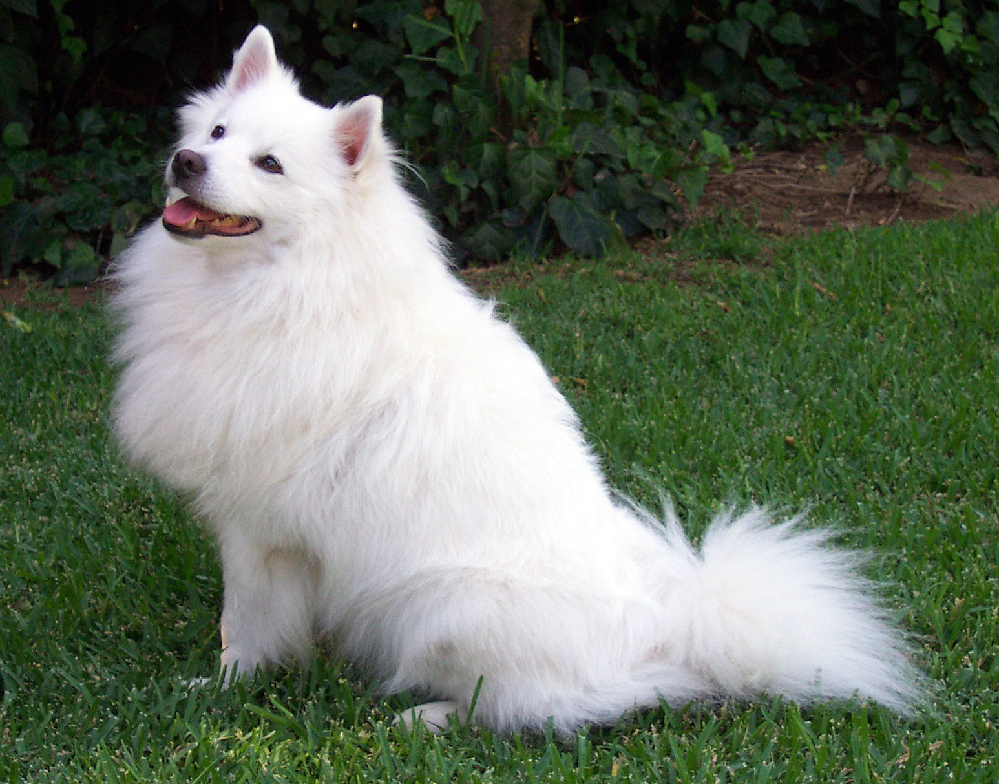

In [10]:
# Test the model works with a sample dog picture
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

from PIL import Image
input_image = Image.open(filename)
input_image

In [11]:
from PIL import Image
from torchvision import transforms
# pre-processing required by ResNext
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


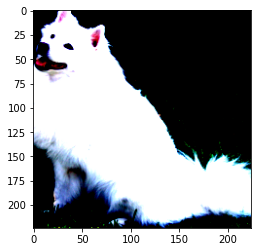

In [97]:
from matplotlib import pyplot as plt
import numpy as np
# Plotting the preprocessed picture to be usable by the model
# the range of values now fall outside the [0..1] RGB valid range
plt.imshow(np.moveaxis(input_tensor.numpy(), 0, -1 ))
plt.show()

shape torch.Size([1, 2048])


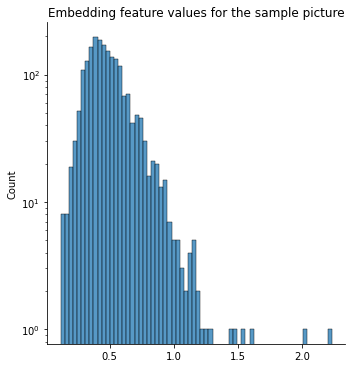

In [13]:
input_batch = torch.stack([input_tensor])

input_batch = input_batch.to(device)

# applying the model to the pre-processed picture and extracting the 2048 ResNext features
with torch.no_grad():
    output = model_conv_features(input_batch).flatten(start_dim=1)
print('shape', output.shape)

import seaborn as sns
sns.displot(output[0].cpu().numpy())
# plt.xscale('log')
plt.yscale('log')
plt.title('Embedding feature values for the sample picture')
plt.show()

In [ ]:
Load COCO dataset

## Download the COCO 2017 validation and annotations

In [14]:
! wget http://images.cocodataset.org/zips/val2017.zip
! wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
! mkdir -p data
! unzip -q val2017.zip -d data
! unzip -q annotations_trainval2017.zip -d data

--2020-11-28 09:28:41--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.66.220
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.66.220|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 777.80M  56.3MB/s    in 13s     

2020-11-28 09:28:54 (58.7 MB/s) - ‘val2017.zip’ saved [815585330/815585330]

--2020-11-28 09:28:55--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.165.235
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.165.235|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  97.0MB/s    in 2.5s    

2020

## Load using the PyCOCO library

In [15]:
import pycocotools
import torchvision.datasets as dset
import os
cwd = os.getcwd() 
data_dir = os.path.join(cwd, 'data')
root= os.path.join(data_dir, 'val2017')
annFile=os.path.join(data_dir, 'annotations', 'instances_val2017.json')


In [16]:
# Load the taxonomy of categories

from pycocotools.coco import COCO

data_type='val2017'
ann_file='{}/annotations/instances_{}.json'.format(data_dir,data_type)
coco=COCO(ann_file)

cats = coco.loadCats(coco.getCatIds())

category_names =[cat['name'] for cat in cats]
print('COCO categories {}: \n{}\n'.format(len(category_names), ' '.join(category_names)))
supercategory_names = set([cat['supercategory'] for cat in cats])
print('COCO supercategories {}: \n{}'.format(len(supercategory_names), ' '.join(supercategory_names)))

loading annotations into memory...
Done (t=0.63s)
creating index...
index created!
COCO categories 80: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories 12: 
vehicle electronic animal food sports appliance accessory outdoor kitchen furniture indoor person


In [17]:
cat_id_to_name_dict = {cat['id']: cat['name'] for cat in cats}
cat_id_to_supercategory_name = {cat['id']: cat['supercategory'] for cat in cats}

annotation categories in the picture ['person', 'person', 'handbag', 'bicycle']


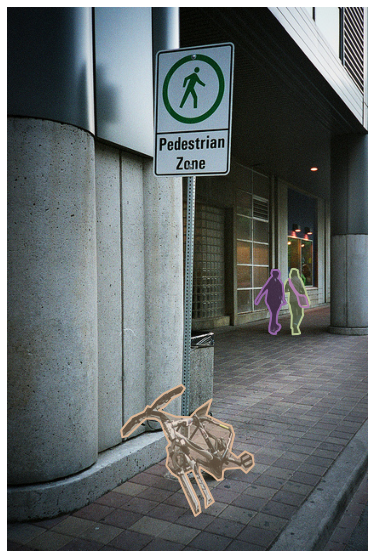

In [18]:
# load and display instance annotations

import skimage.io as io
import matplotlib.pyplot as plt
import pylab

# imgIds = coco.getImgIds(imgIds = [72852, 478474, 108440, 129054])
img_id = 72852
img = coco.loadImgs(img_id)[0]
I = io.imread(img['coco_url'])

plt.imshow(I)
plt.axis('off')
plt.gcf().set_size_inches(8,10)

# catIds = coco.getCatIds(catNms=['person','dog','skateboard']);
annIds = coco.getAnnIds(imgIds=img['id'], iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)
print('annotation categories in the picture', [cat_id_to_name_dict[ann['category_id']] for ann in anns])

## Load using the [torchvision API](https://pytorch.org/docs/stable/torchvision/datasets.html)

In [19]:
# torch datasets API
coco_val = dset.CocoDetection(root = root,
                              annFile = annFile, transform = preprocess)

# 5000 pictures with associated labels
len(coco_val)

loading annotations into memory...
Done (t=0.90s)
creating index...
index created!


5000

In [20]:
X, y = coco_val[0]

In [21]:
X.shape

torch.Size([3, 224, 224])

In [22]:
# annotation format
y[0].keys()

dict_keys(['segmentation', 'area', 'iscrowd', 'image_id', 'bbox', 'category_id', 'id'])

In [23]:
from torch.utils.data import DataLoader
import multiprocessing

cpu_count = multiprocessing.cpu_count()
print('cpus', cpu_count)
batch_size = 64

data_loader = torch.utils.data.DataLoader(dataset=coco_val, 
                                          batch_size=batch_size,
                                          shuffle=False,
                                          num_workers=cpu_count,
                                          collate_fn=lambda x: x)

cpus 2


In [24]:
from tqdm import tqdm
features_list = []
labels_list = []

# Use GPUs to speed up the inference, this should take around 1 minute

model_conv_features.to(device)
for batch in tqdm(data_loader):
    image_batch, label_batch = [x[0] for x in batch], [x[1] for x in batch]
    image_batch = torch.stack(image_batch).to(device) 

    with torch.no_grad():
        features_batch = model_conv_features(image_batch).flatten(start_dim=1)
    features_list.append(features_batch)
    labels_list.extend(label_batch)
        
        

100%|██████████| 79/79 [01:06<00:00,  1.18it/s]


In [25]:
# concat features
features  = torch.cat(features_list)
features.shape


torch.Size([5000, 2048])

In [26]:
# features=torch.load(os.path.join(data_dir, "features_val.pt"))
torch.save(features, os.path.join(data_dir, "features_val.pt"))

In [27]:
# extract and concat labels, None in case of multiple labels
from collections import Counter
category_labels=[]
supercategory_labels = []
image_ids = []

for label in labels_list:
    
    if len(label) > 0:
        categories = []
        supercategories = []
        
        for annotation in label:
            categories.append(coco_val.coco.cats[annotation['category_id']]['name'])
            supercategories.append(coco_val.coco.cats[annotation['category_id']]['supercategory'])
        
        # most common category among objects in the picture
        category, _ = Counter(categories).most_common(1)[0]
        supercategory, _ = Counter(supercategories).most_common(1)[0]
        
        image_ids.append(label[0]['image_id'])
        category_labels.append(category)
        supercategory_labels.append(supercategory)
    else:
        category_labels.append(None)
        supercategory_labels.append(None)
        image_ids.append(None)
        
len(category_labels), len(supercategory_labels), len(image_ids)

(5000, 5000, 5000)

In [28]:
Counter(category_labels).most_common(10)

[('person', 1564),
 ('car', 241),
 ('chair', 156),
 ('bottle', 129),
 ('cat', 115),
 ('book', 111),
 ('dog', 109),
 ('bird', 88),
 ('toilet', 85),
 ('giraffe', 82)]

In [29]:
Counter(supercategory_labels).most_common(10)

[('person', 1403),
 ('animal', 735),
 ('vehicle', 614),
 ('kitchen', 408),
 ('furniture', 407),
 ('food', 338),
 ('indoor', 295),
 ('electronic', 192),
 ('outdoor', 176),
 ('sports', 160)]

In [30]:
print("Number of COCO categories in the data", len(set(category_labels)), len(set(supercategory_labels)))

Number of COCO categories in the data 81 13


# Feature exploration

In [49]:
import numpy as np
from sklearn.manifold import TSNE

X = features.to("cpu").numpy()


In [50]:
import pandas as pd
X_df = pd.DataFrame(X)

In [52]:
#top features by their variance
top_features = np.argsort(np.std(X, axis=0))[-50:][::-1]
top_features                            


array([   3, 1028, 1256,  183,  685, 1471,  176, 1075, 1277,  338, 1138,
       1219, 1377, 1171, 1690, 1680,  962,  766,   39, 1831,  797, 1191,
        738,  485, 1801,   12, 1732, 1380, 1617,  867,  937,  193,  460,
       2011,  301, 1204, 1496, 1806, 1333, 1336, 1994,  744,  106,  790,
       1011,  562,  103,  449,  904,  155])

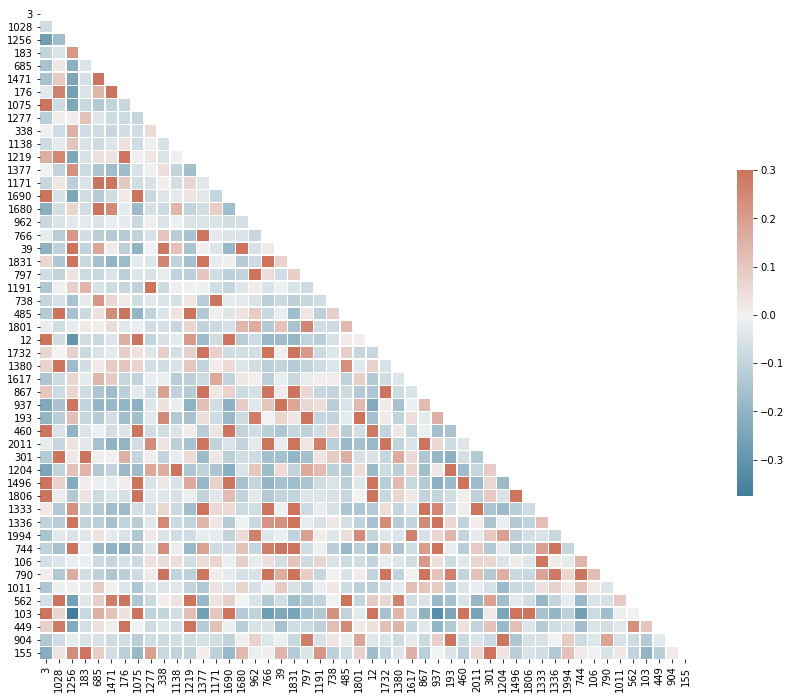

In [62]:
# correlation matrix
corr = X_df.iloc[:, top_features].corr()
# upper triangle mask
mask = np.triu(np.ones_like(corr, dtype=bool))
fig, ax = plt.subplots(figsize=(16, 12))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

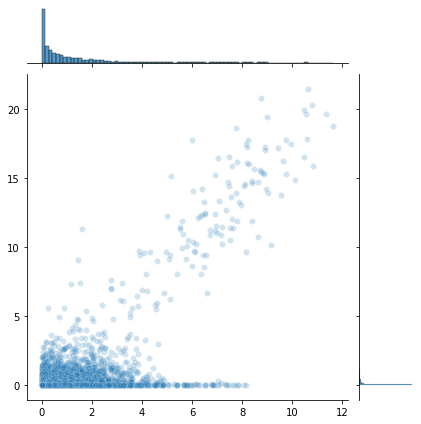

In [64]:
h = sns.jointplot(x=X[:, 301],y=X[:, 183], alpha=0.2)


Text(0.5, 1.0, 'Dimensionality statistics')

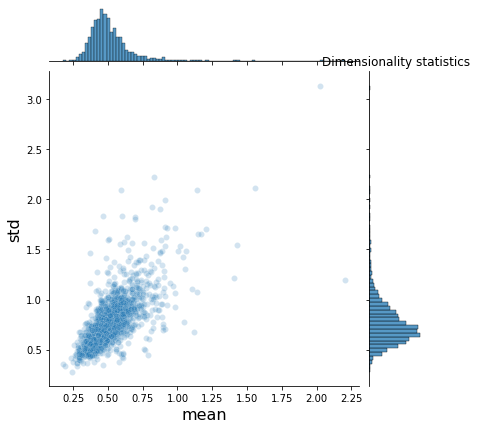

In [65]:
h = sns.jointplot(data=X_df.agg(['mean', 'std'], axis=0).T, x='mean', y='std', alpha=0.2)

# JointGrid has a convenience function
h.set_axis_labels('mean', 'std', fontsize=16)
plt.title('Dimensionality statistics')

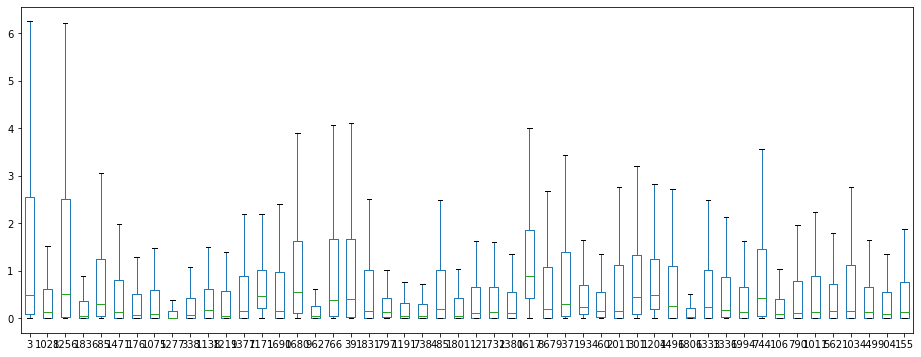

In [68]:
X_df[top_features].plot.box(figsize=(16,6), showfliers=False)

In [ ]:
X_df.pivot()

Text(0.5, 1.0, 'Distribution of the l2 norm of each feature dimension')

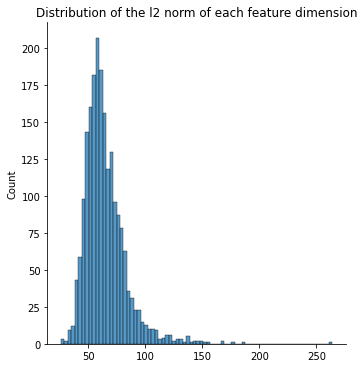

In [69]:
sns.displot(X_df.apply(np.linalg.norm, axis=0))
plt.title('Distribution of the l2 norm of each feature dimension')

In [70]:
X_df[top_features].describe()

,3,1028,1256,183,685,1471,176,1075,1277,338,1138,1219,1377,1171,1690,1680,962,766,39,1831,797,1191,738,485,1801,12,1732,1380,1617,867,937,193,460,2011,301,1204,1496,1806,1333,1336,1994,744,106,790,1011,562,103,449,904,155
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2.027021,0.830867,1.554685,0.595263,1.140236,0.910342,0.814414,0.875903,0.464291,0.600891,0.693128,0.697447,0.910494,0.983298,0.923521,1.207865,0.406450,1.168159,1.148129,0.916998,0.635525,0.505671,0.500059,0.884418,0.614161,0.761937,0.672263,0.585520,1.424832,0.909354,1.020699,0.821721,0.644107,0.886950,1.002851,1.063262,0.871874,0.368254,0.872872,0.776119,0.658009,1.040155,0.483697,0.724986,0.758030,0.734225,0.859120,0.643356,0.546548,0.702562
std,3.131494,2.223216,2.112120,2.091826,2.088376,1.991392,1.924538,1.904633,1.836348,1.827905,1.823808,1.804398,1.721682,1.716592,1.715504,1.705371,1.686805,1.651589,1.649052,1.627285,1.620761,1.608135,1.596996,1.590015,1.573020,1.568478,1.563610,1.553674,1.539069,1.537437,1.535424,1.513675,1.491538,1.487694,1.487316,1.479304,1.473879,1.467371,1.464965,1.433568,1.425943,1.424137,1.414227,1.397892,1.395538,1.390064,1.383475,1.380983,1.377460,1.371691
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.092634,0.001380,0.022102,0.000000,0.047332,0.003812,0.000000,0.000698,0.000000,0.000000,0.008376,0.000000,0.002748,0.204601,0.006395,0.095214,0.000000,0.036723,0.030014,0.002666,0.030175,0.000000,0.000000,0.004473,0.000000,0.000000,0.000000,0.000000,0.426144,0.004194,0.048436,0.073709,0.026475,0.000000,0.090388,0.197951,0.006159,0.000000,0.009841,0.015991,0.009111,0.044475,0.002074,0.000000,0.000283,0.008322,0.008723,0.000000,0.000000,0.000000
50%,0.494444,0.125075,0.500001,0.035062,0.296480,0.119404,0.054993,0.075075,0.002850,0.070787,0.159938,0.042574,0.146204,0.471655,0.155447,0.538213,0.045886,0.386217,0.394943,0.155325,0.136224,0.045010,0.034362,0.193540,0.046919,0.095917,0.125105,0.107000,0.888137,0.198913,0.296521,0.235459,0.141196,0.148842,0.448330,0.477939,0.253312,0.022619,0.226684,0.162839,0.129549,0.423465,0.085438,0.111925,0.120784,0.147398,0.157234,0.121248,0.091649,0.128298
75%,2.557103,0.613856,2.498766,0.350983,1.249734,0.797402,0.515095,0.594035,0.152643,0.426533,0.601462,0.559675,0.877458,1.001812,0.971568,1.620304,0.245640,1.656478,1.660345,1.007213,0.420252,0.305580,0.288924,1.002862,0.414470,0.653657,0.645722,0.539892,1.862672,1.074480,1.400359,0.705144,0.554459,1.106629,1.337554,1.246971,1.089639,0.201954,1.004454,0.864444,0.654512,1.460049,0.410528,0.785899,0.892437,0.724300,1.116779,0.659333,0.537280,0.751487
max,17.865005,19.073303,12.202955,21.506193,18.236713,18.071634,15.095960,13.587487,22.162910,20.963528,20.039314,21.590046,12.276475,15.182200,13.455853,15.144658,22.387070,9.671415,12.499770,10.796453,19.933825,20.667841,15.851222,11.183398,18.431568,13.354285,15.371095,16.562792,12.845268,12.299411,11.860016,12.138226,17.426701,11.143258,11.641232,11.886206,15.332636,21.935074,10.767381,13.028265,16.938833,10.452400,22.107914,15.252278,12.2

Text(0.5, 1.0, 'Distribution of the l2 norm of each picture')

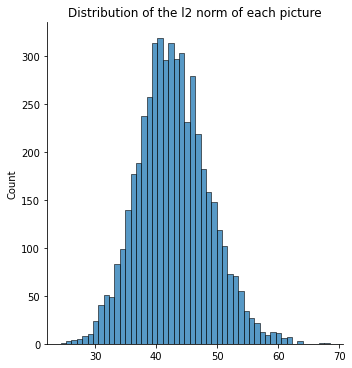

In [72]:
sns.displot(np.linalg.norm(X, axis=1))
plt.title('Distribution of the l2 norm of each picture')

In [73]:
from sklearn import preprocessing
# The L2 normalization can be useful for implementing the cosine k-means
scaler = preprocessing.Normalizer(norm='l2')
X_normalized = scaler.fit_transform(X)
np.linalg.norm(X, axis=1).mean(), np.linalg.norm(X_normalized, axis=1).mean()

(42.814735, 1.0)

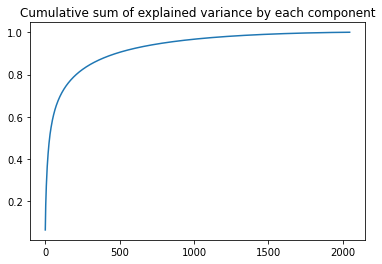

In [74]:
# Extracting all of the principal components 

from sklearn.decomposition import PCA
pca = PCA(n_components=X.shape[1])
X_pca = pca.fit_transform(X)
plt.plot(range(X_pca.shape[1]), np.cumsum(pca.explained_variance_ratio_))
plt.title('Cumulative sum of explained variance by each component')
plt.show()

In [75]:
# Reducing the dimensionality to 3
from sklearn.manifold import TSNE

X_tsne = TSNE(n_components=3, verbose=1,random_state=46, 
              perplexity=40, n_iter=300).fit_transform(X)
X_tsne.shape

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 1.589s...
[t-SNE] Computed neighbors for 5000 samples in 112.569s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 9.556918
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.983368
[t-SNE] KL divergence after 300 iterations: 1.508753


(5000, 3)

In [47]:
# TODO: UMAP
X_umap = None

In [44]:
import pandas as pd
#TODO: replace with interactive plotly such that we may not need the tensorboard
def print_3d(X_tsne, labels, title=None, columns=['x0', 'x1', 'x2']):
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    df = pd.DataFrame(X_tsne, columns=columns)
    df['label'] = labels
    cmap = plt.get_cmap('gist_rainbow')
    unique_labels = list(set(labels))
    labels_dict = {label: i for i, label in enumerate(unique_labels)}
    num_colors = len(unique_labels)
    c = [cmap(1.*labels_dict[label]/num_colors) for label in labels]

    df['c'] = c
    df = df[~df['label'].isna()]
    ax = plt.figure(figsize=(16,10)).gca(projection='3d')
    
    for label, grp in df.groupby('label'):
        ax.scatter(
        xs=grp[columns[0]], 
        ys=grp[columns[1]], 
        zs=grp[columns[2]], 
        c=grp['c'], 
        alpha=0.2,
        label=label
    #     cmap='gist_rainbow'
    )
    
    ax.set_xlabel(columns[0])
    ax.set_ylabel(columns[1])
    ax.set_zlabel(columns[2])
    
    plt.legend(loc='best')
    if title:
        plt.title(title)
    plt.show()


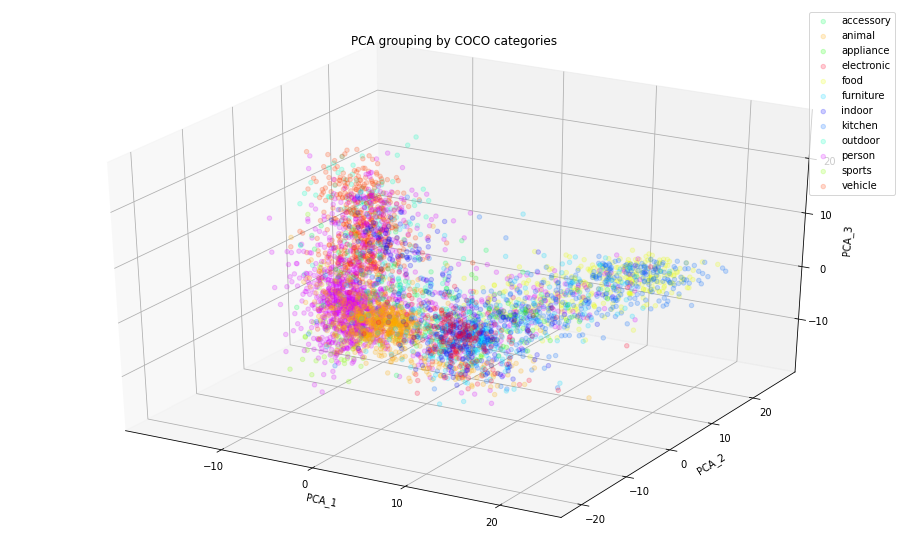

In [77]:
print_3d(X_pca[:, :3], supercategory_labels, 'PCA grouping by COCO categories', columns=['PCA_1', 'PCA_2', 'PCA_3'])

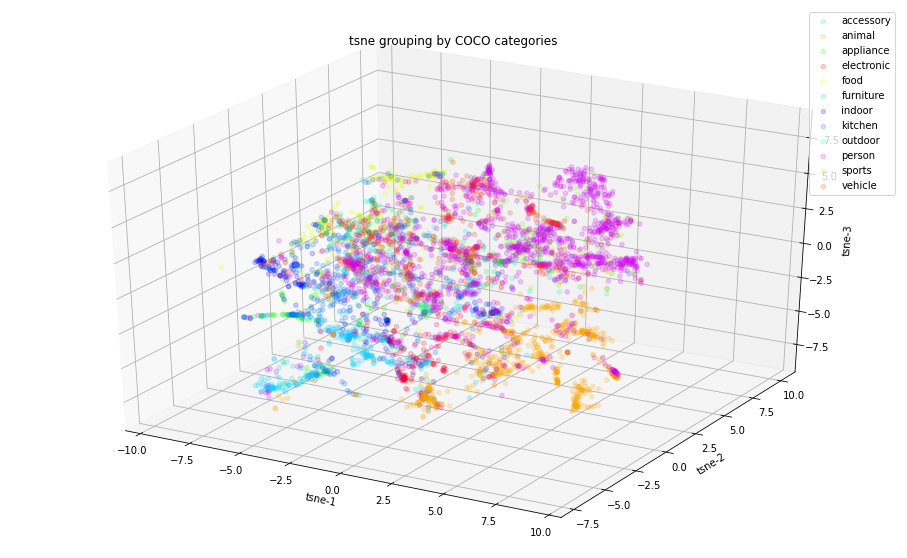

In [78]:
print_3d(X_tsne, supercategory_labels, 'tsne grouping by COCO categories', columns=['tsne-1', 'tsne-2', 'tsne-3'])

## Interactive exploration in Tensorboard

In [79]:
import os
import shutil
from tensorboard.plugins import projector
import tensorflow.compat.v1 as tf

In [81]:
# the text labels to assign to each picture
metadata = [f'{img_id}: {supercategory}/{category}' for img_id, category, supercategory in zip(image_ids, category_labels, supercategory_labels)]
metadata[:10]

['139: furniture/chair',
 '285: animal/bear',
 '632: indoor/book',
 '724: outdoor/stop sign',
 '776: indoor/teddy bear',
 '785: person/person',
 '802: appliance/refrigerator',
 '872: sports/person',
 '885: person/person',
 '1000: person/person']

In [82]:
import numpy as np
#from https://medium.com/looka-engineering/how-to-visualize-feature-vectors-with-sprites-and-tensorflows-tensorboard-3950ca1fb2c7
def create_sprite(data):
    """
    Tile images into sprite image. 
    Add any necessary padding
    """

    # For B&W or greyscale images
    if len(data.shape) == 3:
        data = np.tile(data[...,np.newaxis], (1,1,1,3))

    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = ((0, n ** 2 - data.shape[0]), (0, 0), (0, 0), (0, 0))
    data = np.pad(data, padding, mode='constant',
            constant_values=0)
    
    # Tile images into sprite
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3, 4))
    # print(data.shape) => (n, image_height, n, image_width, 3)
    
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    # print(data.shape) => (n * image_height, n * image_width, 3) 
    return data

In [83]:
import cv2

# Max sprite size to make visualization easy
# MAX_NUMBER_SAMPLES = 8191 
MAX_NUMBER_SAMPLES = 500

IMAGE_SIZE = (64, 64)
# Load and stack all of the images in a single array, it may take up to ~10 minutes
# as alternative you could use `collage` bash script
img_data = []
for img_id in tqdm(coco_val.ids[:MAX_NUMBER_SAMPLES]):
    img = coco.loadImgs(img_id)[0]['coco_url']
    input_img = cv2.imread(img)

    # extract first frame in case of animated gif
    if input_img is None:
        gif = cv2.VideoCapture(img)
        okay, frame = gif.read()
        input_img = frame

    input_img_resize = cv2.resize(input_img, IMAGE_SIZE) 
    img_data.append(input_img_resize)


img_data = np.array(img_data)

sprite = create_sprite(img_data)

100%|██████████| 500/500 [00:51<00:00,  9.63it/s]


In [94]:
sprite.shape, np.moveaxis(sprite, 0, 2).shape

((1472, 1472, 3), (1472, 3, 1472))

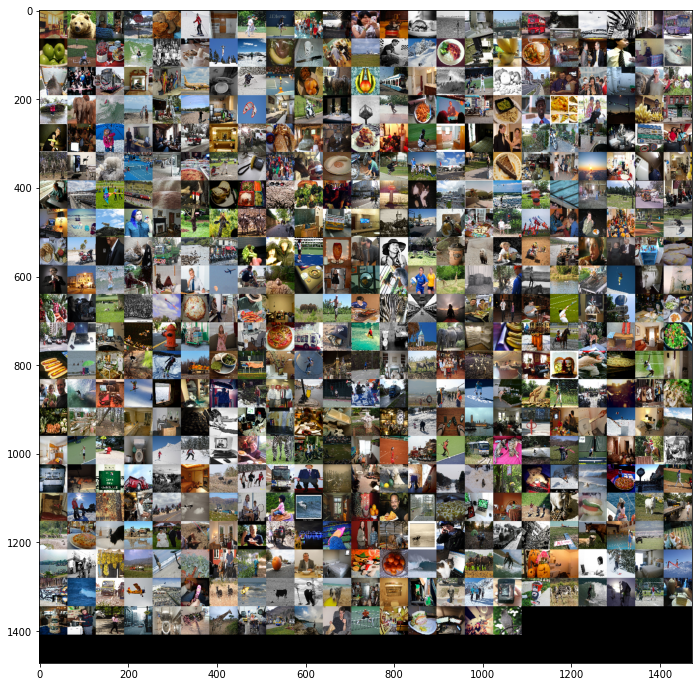

In [99]:
# the sprite image is in BGR format, let's convert to RGB to visualize it with matplotlib
plt.imshow(cv2.cvtColor(sprite,cv2.COLOR_BGR2RGB))
plt.gcf().set_size_inches(12,12)

In [100]:
import os
import shutil
from tensorboard.plugins import projector
import tensorflow.compat.v1 as tf
import cv2

def store_embedding_matrix(embedding_matrix, 
                           embedding_matrix_metadata, 
                           name, 
                           log_folder="./tensorboard_log",
                           metadata_path="metadata.txt",
                           sprite=None,
                           sprite_image_name='sprite.png', 
                           sprite_single_image_dim=(64, 64)):
    log_folder = f"{log_folder}"
    tf.disable_v2_behavior()
    if os.path.exists(log_folder):
        shutil.rmtree(log_folder)
    os.makedirs(log_folder)
    print(f"Store metadata for tensorboard")
    with open(os.path.join(log_folder, metadata_path), mode="wb") as metadata_f:
        for metadata in embedding_matrix_metadata:
            metadata_f.write(metadata.encode('utf-8') + b"\n")
    print(f"Building a mocked tf graph")
    embedding_tensor = tf.Variable(embedding_matrix, name=name, dtype=tf.float32)
    config = projector.ProjectorConfig()
    tensor_config = config.embeddings.add()
    tensor_config.tensor_name = embedding_tensor.name
    tensor_config.metadata_path = metadata_path

    print('Save sprite image')
    if sprite is not None:
        sprite_image_path = os.path.join(log_folder, sprite_image_name)
        cv2.imwrite(sprite_image_path, sprite)
        tensor_config.sprite.image_path = sprite_image_path
        tensor_config.sprite.single_image_dim.extend(sprite_single_image_dim)
    
    print(f"Write summaries")
    summary_writer = tf.summary.FileWriter(log_folder)
    projector.visualize_embeddings(summary_writer, config)
    print(f"Store session")
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver(save_relative_paths=True)
        saver.save(sess, os.path.join(log_folder, "checkpoint.ckpt"))

In [101]:
LOG_FOLDER = os.path.join(data_dir, "tensorboard_log")

store_embedding_matrix(
    embedding_matrix = X_normalized, 
    embedding_matrix_metadata=metadata, 
    log_folder=LOG_FOLDER,
    sprite=sprite,
    name='COCO-resnext-features'
)

Store metadata for tensorboard
Building a mocked tf graph
Save sprite image
Write summaries
Store session


Let's open the embedding matrix into the interactive TensorBoard. After the service is started, select "PROJECTOR" from the top right menu.

Please be careful the tensorboard might slow down your browser.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {LOG_FOLDER}

## Similar pictures (neighbours)

Let's zoom into a few pictures manually picked from the clusters identified in the tensorboard


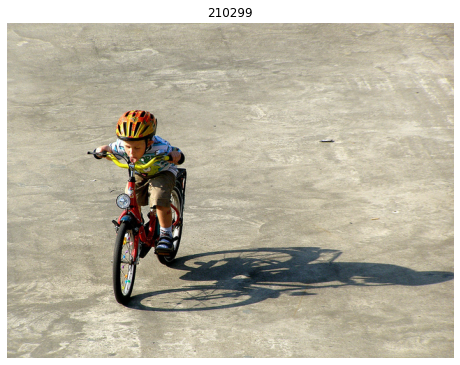

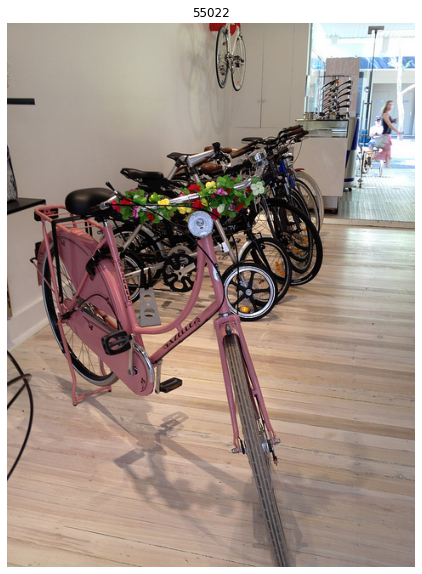

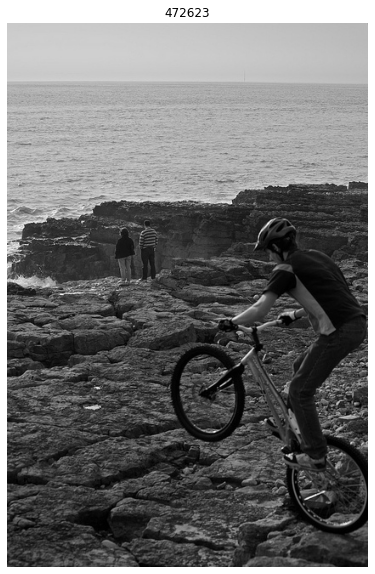

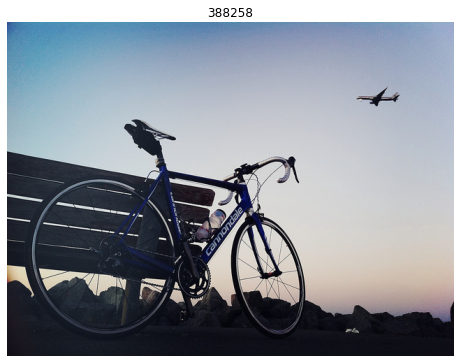

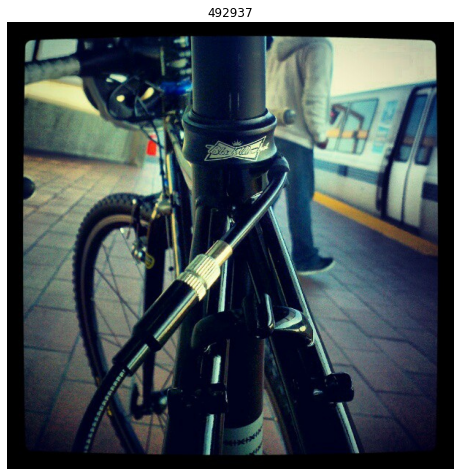

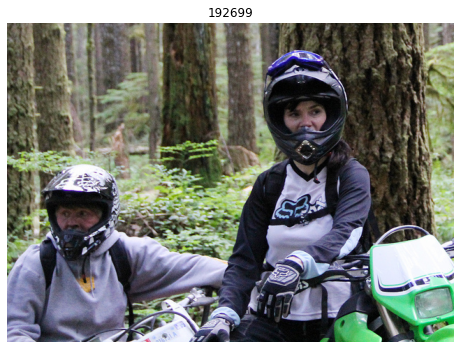

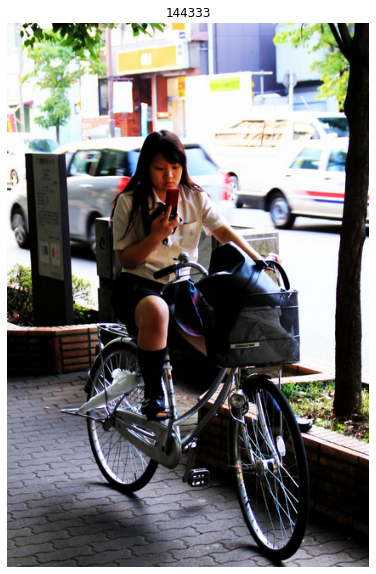

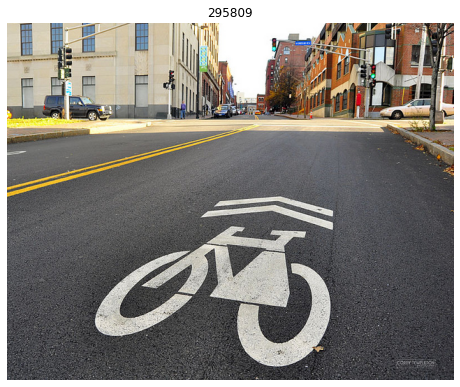

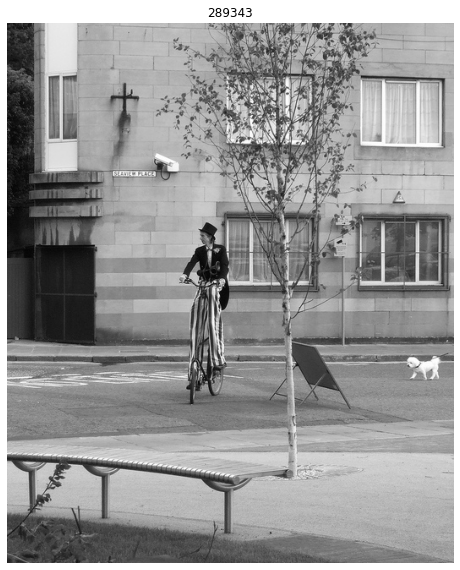

In [103]:
# bycicle cluster
imgIds =[210299, 55022, 472623, 388258, 492937, 192699, 144333, 295809, 289343]

for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.gcf().set_size_inches(8,10)
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

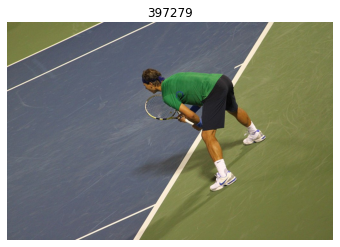

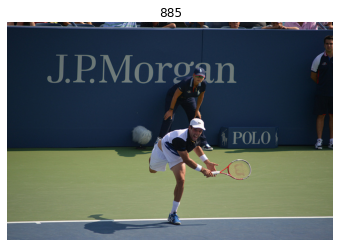

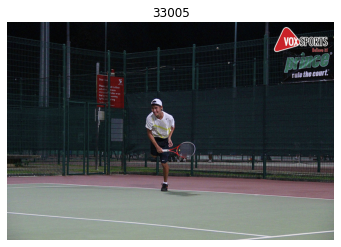

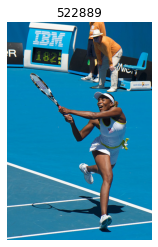

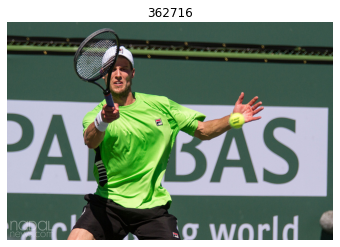

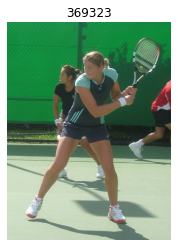

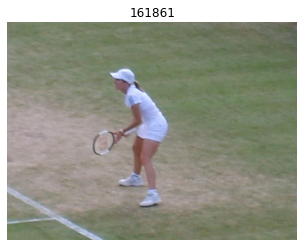

In [104]:
# tennis
imgIds =[397279, 885, 33005, 522889, 362716, 369323, 161861]

for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

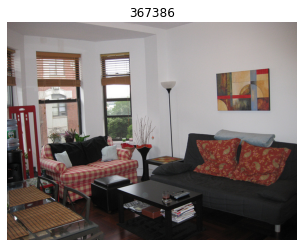

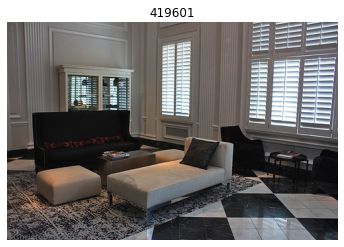

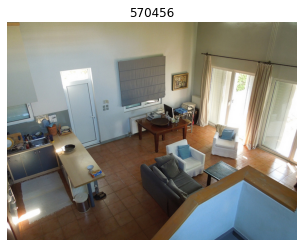

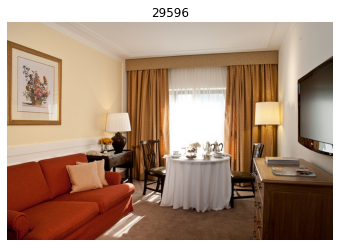

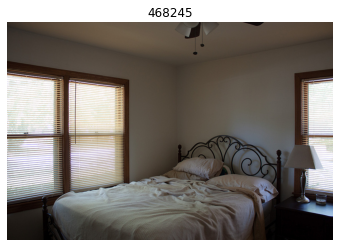

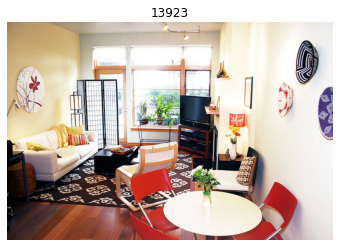

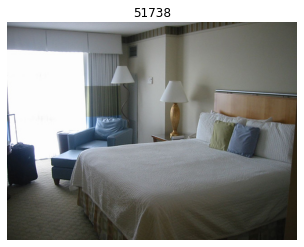

In [105]:
# home interior and furnitures

imgIds =[367386, 419601, 570456, 29596, 468245, 13923, 51738]

for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

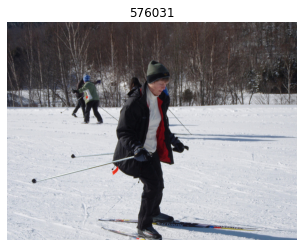

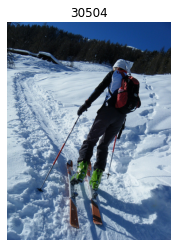

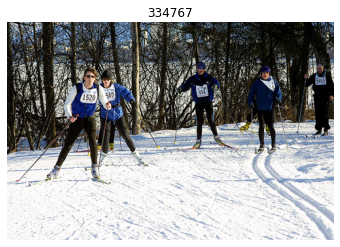

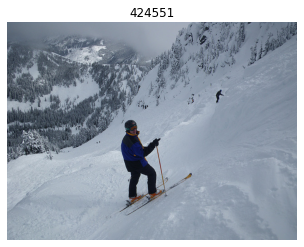

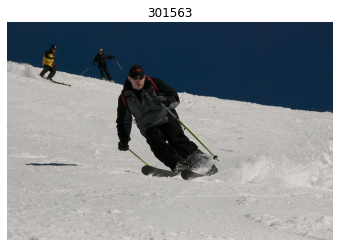

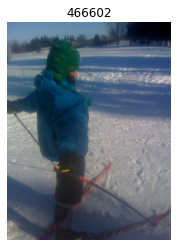

In [106]:
# skiing

imgIds =[576031, 30504, 334767, 424551, 301563, 466602]

for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

# Clustering

## Soft Clustering using GMM

In [ ]:
import sklearn
import numpy as np
from sklearn import mixture
import itertools

# Select best model based on the minimization of the 
# Bayesian Information Criterion (BIC)

#init
best_gmm = None
best_config = None
lowest_bic = np.infty
bic_dict = {}

#Explanations of the different covariance types: https://stats.stackexchange.com/questions/326671/different-covariance-types-for-gaussian-mixture-models
cv_types = ['spherical', 'tied', 'diag', 'full']
k_range = range(10, 51, 5)

for k, cv_type in tqdm(list(itertools.product(k_range, cv_types))):
    if (k, cv_type) not in bic_dict:
        try:
            gmm = mixture.GaussianMixture(n_components=k, 
                                        covariance_type=cv_type,
                                        reg_covar=1e-4,
                                        random_state=46)
            gmm.fit(X)
            bic_score = gmm.bic(X)
            bic_dict[(k, cv_type)] = bic_score
            if bic_score < lowest_bic:
                lowest_bic = bic_score
                best_gmm = gmm
                best_config = (k, cv_type)
                print(best_config, lowest_bic)
        except Exception as e:
            print(k, cv_type)
            print(e)

  3%|▎         | 1/36 [00:10<05:55, 10.15s/it]

(10, 'spherical') 22049292.309308436


  8%|▊         | 3/36 [01:50<14:38, 26.62s/it]

(10, 'diag') 16520799.7643338


 19%|█▉        | 7/36 [05:20<18:48, 38.91s/it]

(15, 'diag') 15313663.67627811


 31%|███       | 11/36 [11:47<30:38, 73.56s/it] 

(20, 'diag') 14426572.251585465


 42%|████▏     | 15/36 [19:20<31:29, 89.96s/it] 

(25, 'diag') 13633637.850606017


 53%|█████▎    | 19/36 [27:06<25:58, 91.67s/it] 

(30, 'diag') 13238490.1794697


 64%|██████▍   | 23/36 [36:05<22:17, 102.90s/it]

(35, 'diag') 12886484.38532895


 75%|███████▌  | 27/36 [46:09<17:11, 114.63s/it]

(40, 'diag') 12673492.298078086


 86%|████████▌ | 31/36 [56:51<10:02, 120.42s/it]

(45, 'diag') 12526281.277584977


In [1]:
best_gmm,best_config,lowest_bic 

NameError: ignored

In [ ]:
! pip install kneed

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
     from kneed import KneeLocator

# use linestyles to plot as a function of the data transformation, if any
# linestyles={'original': 'solid', 'pca': 'dotted', 'umap': "dashed"}
colors = {'spherical': 'navy', 'tied': 'turquoise', 'diag': 'cornflowerblue', 'full': 'darkorange'}

import pandas as pd
gmm_models_bic = pd.DataFrame([(bic, config[0], config[1]) for config, bic in bic_dict.items()], 
             columns=['bic', 'k', 'cv_type'])

for cv_type, cv_type_bic_scores in gmm_models_bic.groupby('cv_type'):

    x = cv_type_bic_scores['k']
    y = cv_type_bic_scores['bic']
    
    kn = KneeLocator(x, y, curve='convex', direction='decreasing')

    ax=sns.lineplot(x, y, label=cv_type, color=colors[cv_type], linewidth=2)
    # ax.lines[-1].set_linestyle(linestyles[k])
    plt.scatter(kn.knee, kn.elbow_y, color=colors[cv_type], s=50)

plt.gcf().set_size_inches(12,8)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Number of clusters')
plt.ylabel("BIC")

plt.ylim(0, 1)
plt.title("BIC score of GMM versus number of clusters" )
plt.show()

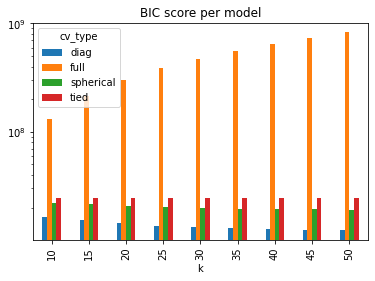

In [ ]:
# Plot the BIC scores

import pandas as pd
gmm_models_bic = pd.DataFrame([(bic, config[0], config[1]) for config, bic in bic_dict.items()], 
             columns=['bic', 'k', 'cv_type'])
gmm_models_bic[gmm_models_bic['k'] <=50].pivot('k', 'cv_type', 'bic').plot(kind='bar',  title='BIC score per model')
plt.yscale("log")
plt.show()

In [ ]:
# As we could see the full cv_type introduces too many degrees of freedom and
# it diverges with the increase of the number of components

# The diagonal covariance matrix is the most constrained and assumes that each feature us independent from each other
# which is a fair assumption considering the nature of the feature space

# We will find the optimal k for the diagonal covariance matrix

cv_type = 'diag'
k_range = range(10, 121, 5)

for k in tqdm(k_range):
    if (k, cv_type) not in bic_dict:
        try:
            gmm = mixture.GaussianMixture(n_components=k, 
                                        covariance_type=cv_type,
                                        reg_covar=1e-4,
                                        random_state=46)
            gmm.fit(X)
            bic_score = gmm.bic(X)
            bic_dict[(k, cv_type)] = bic_score
            if bic_score < lowest_bic:
                lowest_bic = bic_score
                best_gmm = gmm
                best_config = (k, cv_type)
                print(best_config, lowest_bic)
        except Exception as e:
            print(k, cv_type)
            print(e)



 91%|█████████▏| 21/23 [00:33<00:11,  5.72s/it]

(110, 'diag') 11727567.374000171



100%|██████████| 23/23 [01:09<00:00,  3.03s/it]


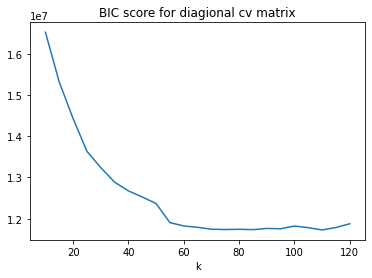

In [ ]:
pd.DataFrame([(config[0], bic) for config, bic in bic_dict.items() if config[1] == 'diag'], columns=['k', 'bic']).set_index('k').sort_index()['bic'].plot(title='BIC score for diagional cv matrix')


In [ ]:
# Or skip the model selection
from sklearn import mixture

# An optimal number of clusters is the elbow at 30
best_config = (30, 'full')
best_gmm = mixture.GaussianMixture(n_components=best_config[0], 
                                   covariance_type=best_config[1], 
                                   reg_covar=1e-4)

# Fitting on the normalized embeddings feature space
best_gmm.fit(X)

In [ ]:
X_probs = best_gmm.predict_proba(X_normalized)
X_clusters = best_gmm.predict(X_normalized)

In [ ]:
pd.Series(X_clusters).value_counts().plot.bar(title='Cluster sizes')

In [ ]:
print_3d(X_tsne, X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}')

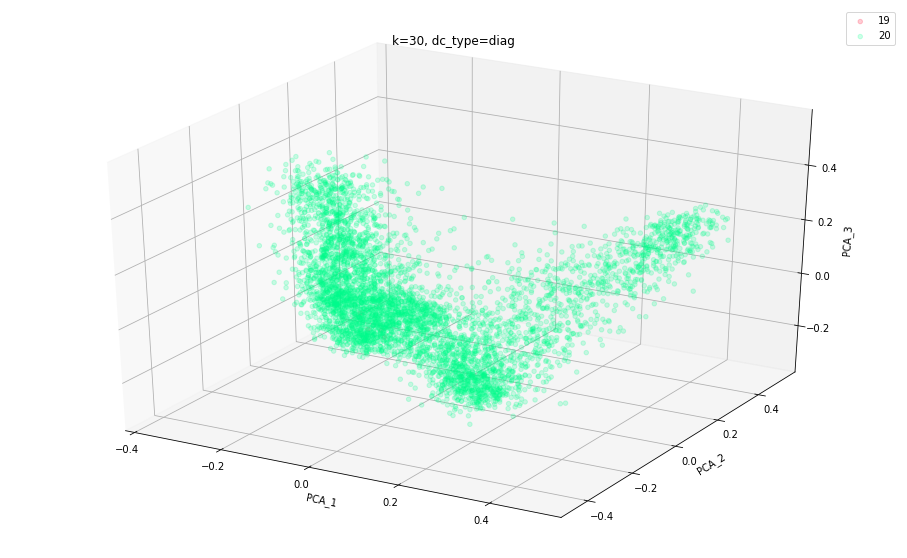

In [ ]:
print_3d(X_pca[:, :3], X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}', columns=['PCA_1', 'PCA_2', 'PCA_3'])